In [1]:
using Pkg; Pkg.activate(".");
using Catalyst, DifferentialEquations, Plots, Statistics, LaTeXStrings;

  Activating project at `~/projects/reaction-networks-example`


# Telegraph model in steady state
Here we'll make a simple telegraph model in steady state and then sample from a trajectory.

In [77]:
rn = @reaction_network begin
  k_off, g --> g_star
  k_on, g_star --> g
  k_t, g --> g + p
  k_d, p --> 0
end k_off k_on k_t k_d

Model ##ReactionSystem#317
States (3):
  g(t)
  g_star(t)
  p(t)
Parameters (4):
  k_off
  k_on
  k_t
  k_d

In [78]:
# rate parameters
p = (0.1, 0.1, 10.0, 1.0)

# time to track trajectory
tspan = (0., 100.0)

# initial position
u0 = [1., 0., 0.]

prob = DiscreteProblem(rn, u0, tspan, p);

In [79]:
# convert to a jump problem
jump_prob = JumpProblem(rn, prob, Direct());

In [80]:
# sample a trajectory
sol = solve(jump_prob, SSAStepper());

In [81]:
# plot sampled trajectory
plot(sol, linewidth=3)

### Sampling at a fixed times

In [82]:
# rate parameters
p = (0.1, 0.1, 10.0, 1.0)

# time to track trajectory
tspan = (0., 1000000.0)

# initial position
u0 = [1., 0., 0.]

prob = DiscreteProblem(rn, u0, tspan, p);

In [83]:
# convert to a jump problem, introducing save positions
# save positions state whether to save before or after a jump.
# Here we do not want the save positions correlated with jumps.
jump_prob = JumpProblem(rn, prob, Direct(), save_positions=(false,false))

# sample a trajectory
sol = solve(jump_prob, SSAStepper(), saveat=2*(1/minimum(p)));

In [84]:
# get an array of protein reads
protein_reads = map(x -> x[3], sol.u);

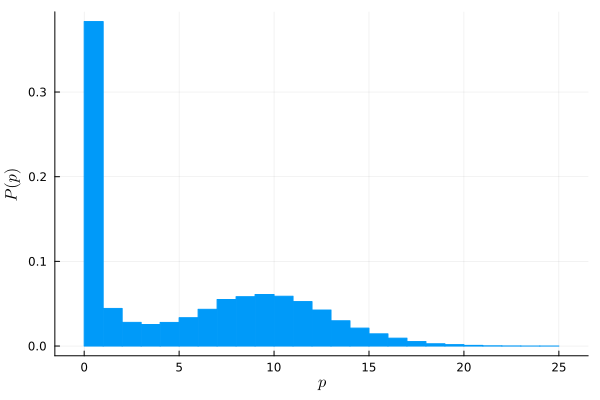

In [85]:
histogram(
    protein_reads, 
    nbins=Int(maximum(protein_reads)),
    linecolor=:match,
    norm=true,
    legend=false,
    xlabel=L"p",
    ylabel=L"P(p)"
)

# Introducing the cell-cycle

In [103]:
# rate parameters
p = (0.5, 1.0, 10.0, 1.0)

# time to track trajectory
tspan = (0., 10.0)

# initial position
u0 = [1., 0., 0.]

prob = DiscreteProblem(rn, u0, tspan, p);
jump_prob = JumpProblem(rn, prob, Direct());

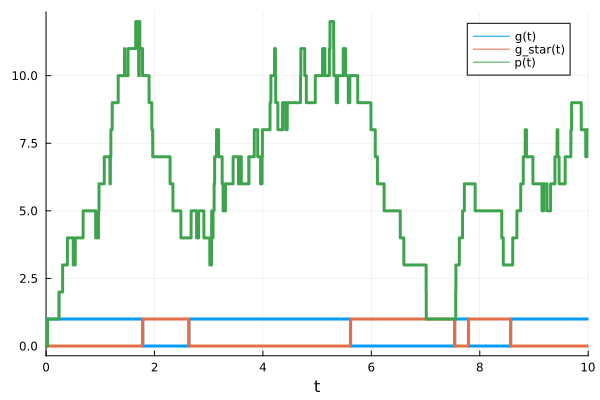

In [104]:
T = 1

condition(u,t,integrator) = t%T==0.0
affect!(integrator) = integrator.u[3] *= 0.5
cb = DiscreteCallback(condition,affect!)
sol = solve(jump_prob, SSAStepper(), callback=cb)
plot(sol, linewidth=3)

affecting

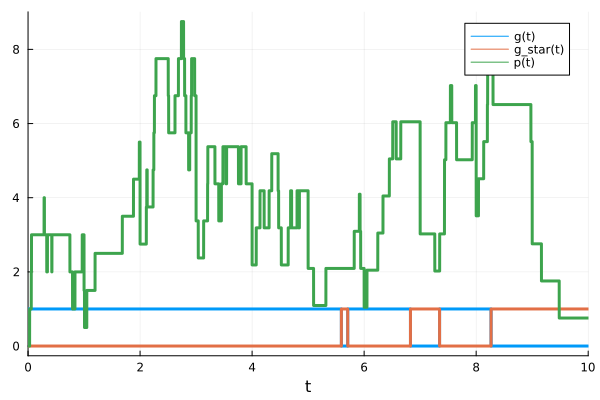

In [110]:
T = 1

condition(u,t,integrator) = t%T==0.0
affect!(integrator) = integrator.u[3] *= 0.5; print("affecting")
cb = DiscreteCallback(condition,affect!)
sol = solve(jump_prob, SSAStepper(), callback=cb, tstops=[0:T:200;])
plot(sol, linewidth=3)

In [106]:
using Distributions

function partition(n)
    dist = Binomial(n)
    return rand(dist)
end

partition (generic function with 1 method)

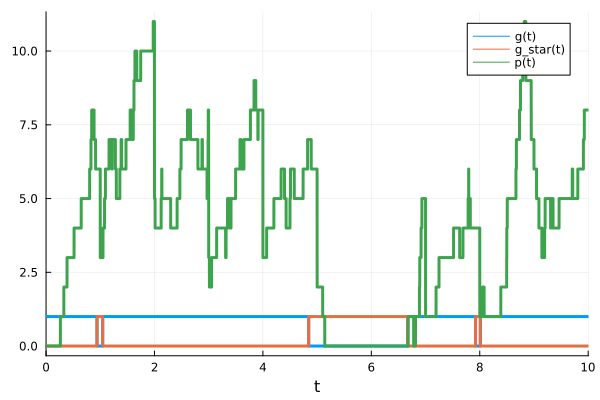

In [108]:
T = 1

condition(u,t,integrator) = t%T==0.0
affect!(integrator) = integrator.u[3] = partition(integrator.u[3])
cb = DiscreteCallback(condition,affect!)
sol = solve(jump_prob, SSAStepper(), callback=cb, tstops=[0:T:200;])
plot(sol, linewidth=3)

In [94]:
slrn = @reaction_network begin
  k_off, g --> g_star
  k_on, g_star --> g
  k_t, g --> g + p
  k_d, p --> 0
  k_n, 0 --> k
end k_off k_on k_t k_d k_n

p = (0.5, 0.5, 10.0, 0.1, 0.1)
tspan = (0., 200.0)
u0 = [1., 0., 0., 0.]
N=10

prob = DiscreteProblem(slrn, u0, tspan, p)
jump_prob = JumpProblem(slrn, prob, Direct())

function affect!(integrator)
    integrator.u[3] = partition(integrator.u[3])
    integrator.u[length(integrator.u)] = 0
end

condition(u,t,integrator) = u[length(u)]==N
cb = DiscreteCallback(condition,affect!)
sol = solve(jump_prob, SSAStepper(), callback=cb)
plot(sol, linewidth=3)